# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

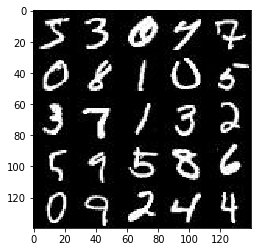

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

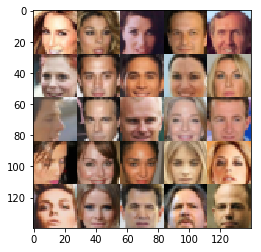

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0


C:\Anaconda3\envs\ai\lib\site-packages\ipykernel_launcher.py:14: UserWarning: No GPU found. Please use a GPU to train your neural network.
  


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real = tf.placeholder(tf.float32, shape=[None, image_width, image_height, image_channels], name='input_real')
    input_z = tf.placeholder(tf.float32, shape=[None, z_dim], name='input_z')
    lr = tf.placeholder(tf.float32, name='learning_rate')
    return input_real, input_z, lr


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def leaky_relu(input):
    return tf.maximum(0.1 * input, input)

def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):        
        conv1 = tf.layers.conv2d(images, 56, 5, 2, 'same')
        conv1 = leaky_relu(conv1)
        
        conv2 = tf.layers.conv2d(conv1, 112, 5, 2, 'same')
        conv2 = tf.layers.batch_normalization(conv2, training=True)
        conv2 = leaky_relu(conv2)
        
        conv3 = tf.layers.conv2d(conv2, 224, 5, 2, 'same')
        conv3 = tf.layers.batch_normalization(conv3, training=True)
        conv3 = leaky_relu(conv3)
        
        flat = tf.reshape(conv3, (-1, 4*4*224))
        logits = tf.layers.dense(flat, 1)

        return tf.sigmoid(logits), logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [15]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    with tf.variable_scope('generator', reuse=(not is_train)):        
        fc = tf.layers.dense(z, 7*7*112)
        fc = tf.reshape(fc, (-1, 7, 7, 112))
        fc = tf.layers.batch_normalization(fc, training=is_train)
        fc = leaky_relu(fc)
        
        conv1 = tf.layers.conv2d_transpose(fc, 56, 5, 2, 'same')
        conv1 = tf.layers.batch_normalization(conv1, training=is_train)
        conv1 = leaky_relu(conv1)
        
        conv2 = tf.layers.conv2d_transpose(conv1, out_channel_dim, 5, 2, 'same')
        
        return tf.tanh(conv2) / 2

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [16]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [17]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [18]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [19]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    steps = 0
    print_every = 30
    show_every = 30
    
    input_real, input_z, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])
    d_opt, g_opt = model_opt(d_loss, g_loss, lr, beta1)
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr: learning_rate})
                _ = sess.run(g_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr: learning_rate})

                if steps % print_every == 0:
                    train_loss_d = d_loss.eval(feed_dict={input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval(feed_dict={input_z: batch_z})
                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

                if steps % show_every == 0:
                    show_generator_output(sess, 16, input_z, data_shape[3], data_image_mode)
                    
        show_generator_output(sess, 16, input_z, data_shape[3], data_image_mode)
    

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Results for parameters:  64 100 0.001 0.3
Epoch 1/2... Discriminator Loss: 1.0728... Generator Loss: 0.8932


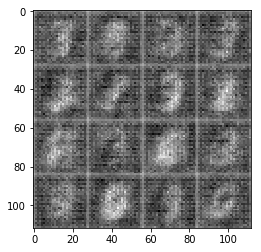

Epoch 1/2... Discriminator Loss: 2.4926... Generator Loss: 0.1088


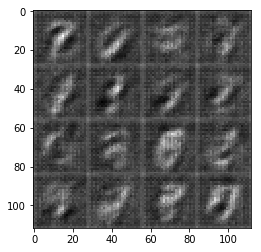

Epoch 1/2... Discriminator Loss: 0.8328... Generator Loss: 1.5650


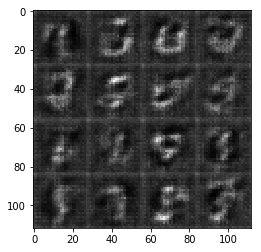

Epoch 1/2... Discriminator Loss: 0.7544... Generator Loss: 1.0024


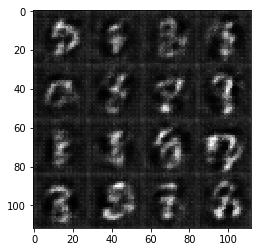

Epoch 1/2... Discriminator Loss: 0.9200... Generator Loss: 1.5806


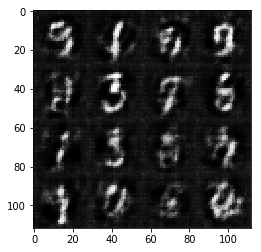

Epoch 1/2... Discriminator Loss: 0.7894... Generator Loss: 1.2647


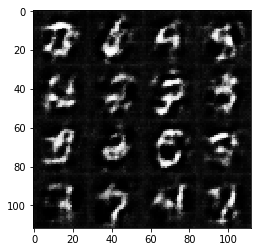

Epoch 1/2... Discriminator Loss: 0.8531... Generator Loss: 0.9797


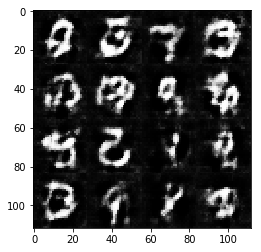

Epoch 1/2... Discriminator Loss: 1.0064... Generator Loss: 0.6561


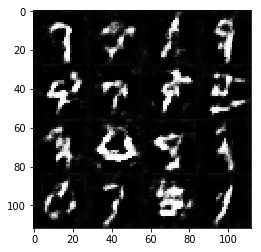

Epoch 1/2... Discriminator Loss: 0.6813... Generator Loss: 1.7067


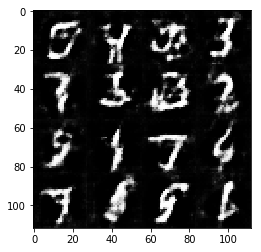

Epoch 1/2... Discriminator Loss: 1.0142... Generator Loss: 0.7222


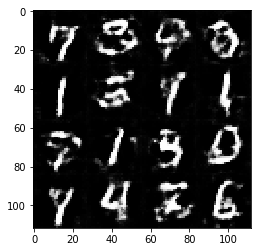

Epoch 1/2... Discriminator Loss: 1.0349... Generator Loss: 0.6610


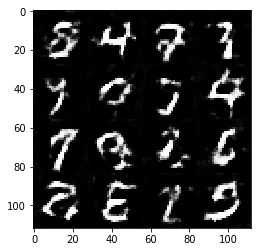

Epoch 1/2... Discriminator Loss: 0.8384... Generator Loss: 0.8093


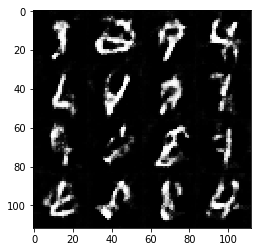

Epoch 1/2... Discriminator Loss: 0.9989... Generator Loss: 0.6867


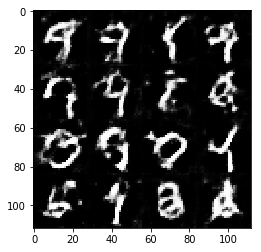

Epoch 1/2... Discriminator Loss: 0.7258... Generator Loss: 1.0250


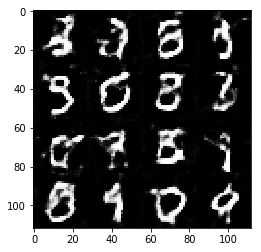

Epoch 1/2... Discriminator Loss: 0.6473... Generator Loss: 1.2729


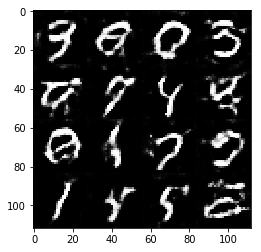

Epoch 1/2... Discriminator Loss: 0.9688... Generator Loss: 0.7542


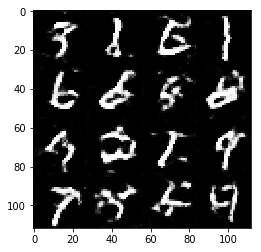

Epoch 1/2... Discriminator Loss: 0.8723... Generator Loss: 0.9915


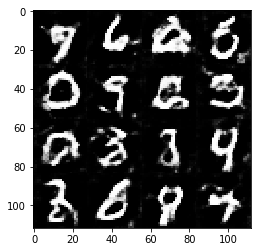

Epoch 1/2... Discriminator Loss: 0.5468... Generator Loss: 1.8299


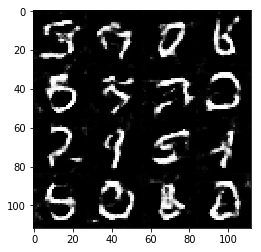

Epoch 1/2... Discriminator Loss: 2.4998... Generator Loss: 0.1345


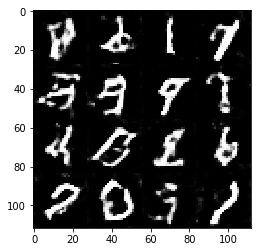

Epoch 1/2... Discriminator Loss: 0.7292... Generator Loss: 1.1414


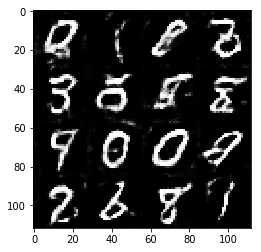

Epoch 1/2... Discriminator Loss: 0.9894... Generator Loss: 0.7138


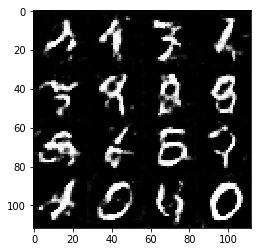

Epoch 1/2... Discriminator Loss: 0.9311... Generator Loss: 0.9072


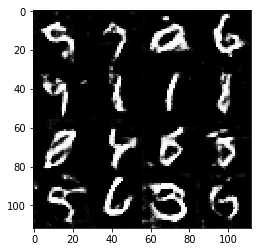

Epoch 1/2... Discriminator Loss: 0.7114... Generator Loss: 2.6944


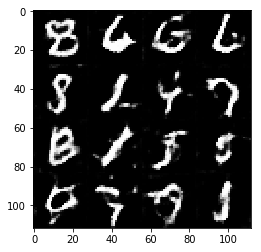

Epoch 1/2... Discriminator Loss: 5.2385... Generator Loss: 6.8317


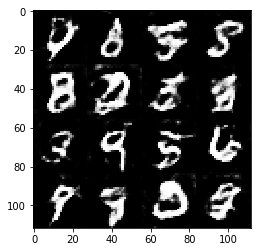

Epoch 1/2... Discriminator Loss: 0.6827... Generator Loss: 1.5870


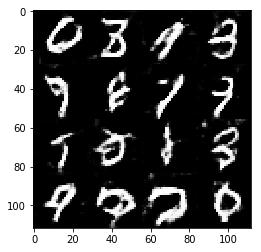

Epoch 1/2... Discriminator Loss: 1.5572... Generator Loss: 0.4629


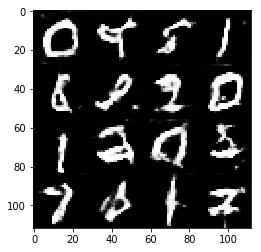

Epoch 1/2... Discriminator Loss: 0.7959... Generator Loss: 1.3144


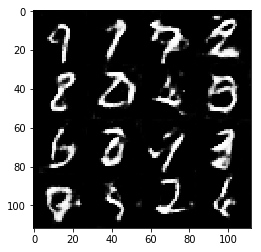

Epoch 1/2... Discriminator Loss: 0.4835... Generator Loss: 1.3633


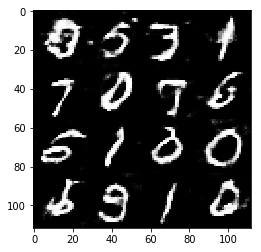

Epoch 1/2... Discriminator Loss: 0.7986... Generator Loss: 1.3317


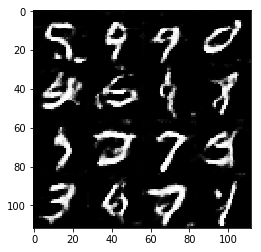

Epoch 1/2... Discriminator Loss: 0.6032... Generator Loss: 1.1833


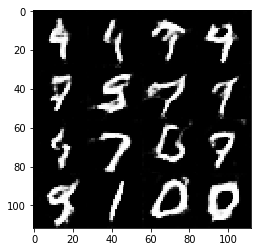

Epoch 1/2... Discriminator Loss: 0.8321... Generator Loss: 0.8135


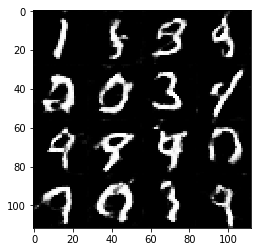

Epoch 2/2... Discriminator Loss: 0.8022... Generator Loss: 0.9165


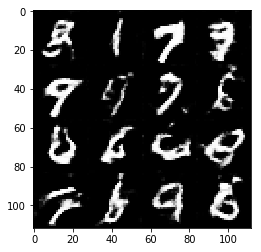

Epoch 2/2... Discriminator Loss: 1.1332... Generator Loss: 0.7639


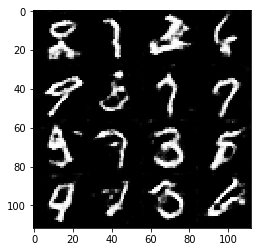

Epoch 2/2... Discriminator Loss: 0.6358... Generator Loss: 1.0731


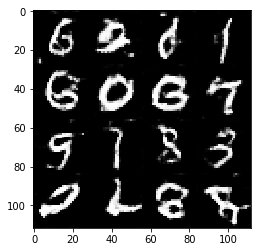

Epoch 2/2... Discriminator Loss: 0.4664... Generator Loss: 1.5355


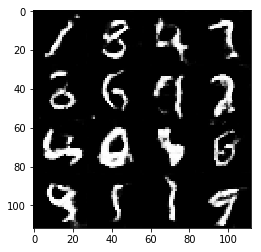

Epoch 2/2... Discriminator Loss: 1.6663... Generator Loss: 0.3115


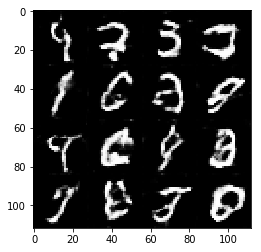

Epoch 2/2... Discriminator Loss: 0.9162... Generator Loss: 0.9216


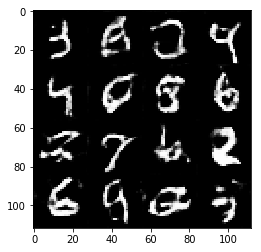

Epoch 2/2... Discriminator Loss: 0.7551... Generator Loss: 0.9246


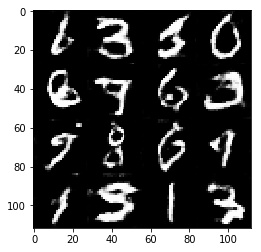

Epoch 2/2... Discriminator Loss: 0.8620... Generator Loss: 1.1556


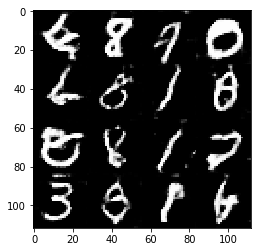

Epoch 2/2... Discriminator Loss: 0.9028... Generator Loss: 0.8245


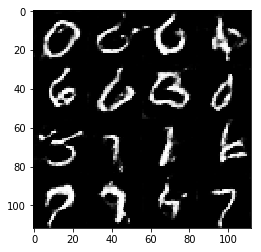

Epoch 2/2... Discriminator Loss: 0.6342... Generator Loss: 1.5490


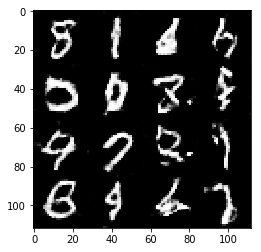

Epoch 2/2... Discriminator Loss: 0.6280... Generator Loss: 1.1450


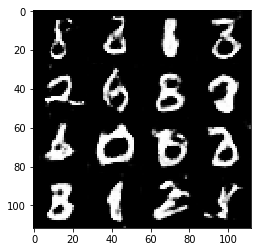

Epoch 2/2... Discriminator Loss: 0.7495... Generator Loss: 0.9738


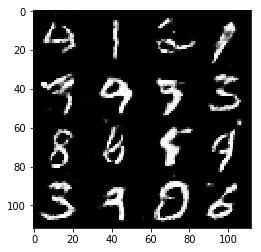

Epoch 2/2... Discriminator Loss: 0.6911... Generator Loss: 2.8647


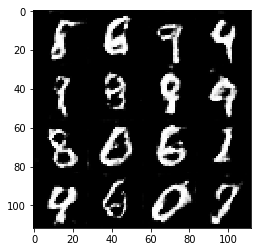

Epoch 2/2... Discriminator Loss: 1.4084... Generator Loss: 0.5165


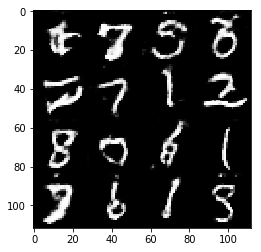

Epoch 2/2... Discriminator Loss: 0.5219... Generator Loss: 1.4289


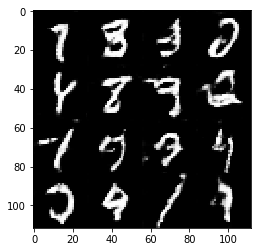

Epoch 2/2... Discriminator Loss: 0.6799... Generator Loss: 1.0914


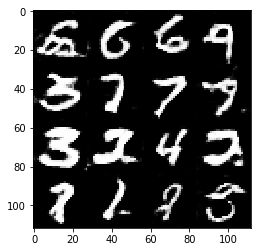

Epoch 2/2... Discriminator Loss: 0.6290... Generator Loss: 1.1215


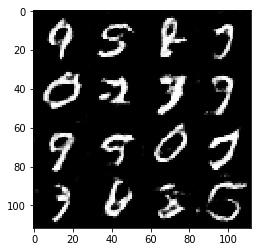

Epoch 2/2... Discriminator Loss: 1.2008... Generator Loss: 0.5556


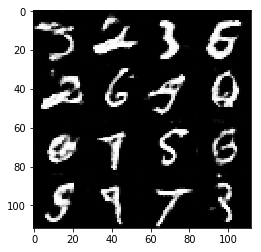

Epoch 2/2... Discriminator Loss: 0.5855... Generator Loss: 1.1574


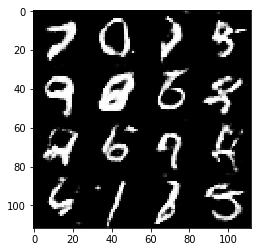

Epoch 2/2... Discriminator Loss: 0.6054... Generator Loss: 1.1997


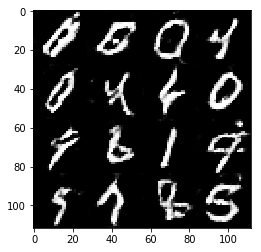

Epoch 2/2... Discriminator Loss: 1.0015... Generator Loss: 3.8039


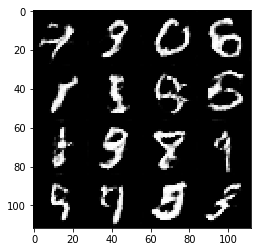

Epoch 2/2... Discriminator Loss: 2.1480... Generator Loss: 0.2335


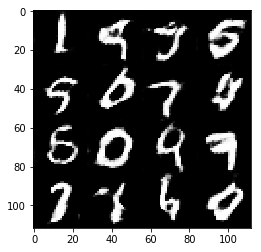

Epoch 2/2... Discriminator Loss: 1.4745... Generator Loss: 3.6395


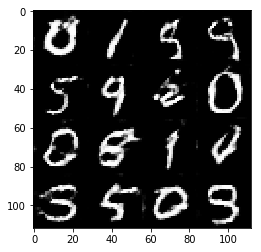

Epoch 2/2... Discriminator Loss: 1.2838... Generator Loss: 0.5281


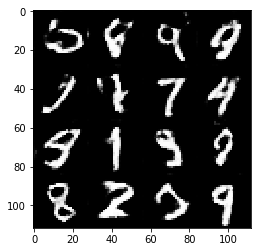

Epoch 2/2... Discriminator Loss: 0.4097... Generator Loss: 1.4899


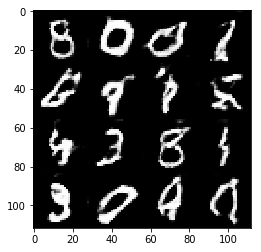

Epoch 2/2... Discriminator Loss: 0.4781... Generator Loss: 1.3984


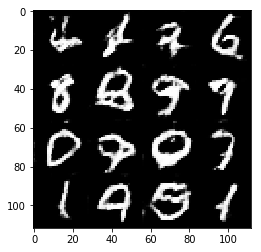

Epoch 2/2... Discriminator Loss: 0.5270... Generator Loss: 1.3948


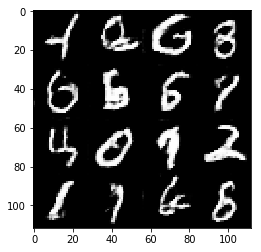

Epoch 2/2... Discriminator Loss: 0.7373... Generator Loss: 1.1250


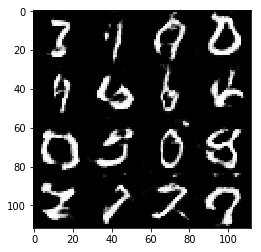

Epoch 2/2... Discriminator Loss: 1.1433... Generator Loss: 2.1458


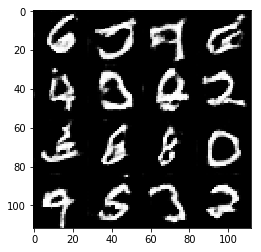

Epoch 2/2... Discriminator Loss: 1.3606... Generator Loss: 0.4781


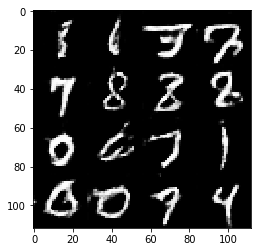

Epoch 2/2... Discriminator Loss: 1.4660... Generator Loss: 2.5479


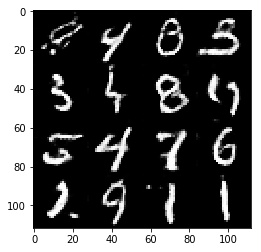

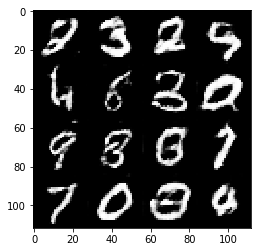

Set finished


In [20]:
#batch_sizes = []
#z_dims = []
#learning_rates = []
#beta1s = []

batch_size = 64
z_dim = 100
learning_rate = 0.001
beta1 = 0.3
epochs = 2

#for batch_size in batch_sizes:
#    for z_dim in z_dims:
#        for learning_rate in learning_rates:
#            for beta1 in beta1s:
print("Results for parameters: ", batch_size, z_dim, learning_rate, beta1)
mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)
print("Set finished")

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/2... Discriminator Loss: 2.3330... Generator Loss: 0.1401


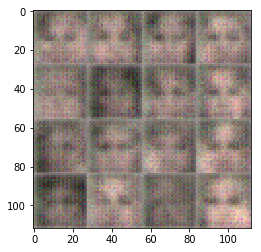

Epoch 1/2... Discriminator Loss: 0.7571... Generator Loss: 2.8977


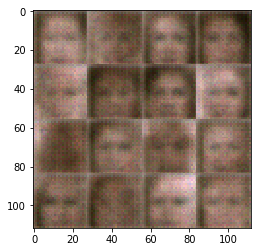

Epoch 1/2... Discriminator Loss: 1.3866... Generator Loss: 1.9611


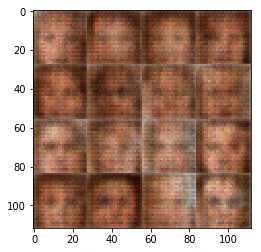

Epoch 1/2... Discriminator Loss: 1.0855... Generator Loss: 0.5590


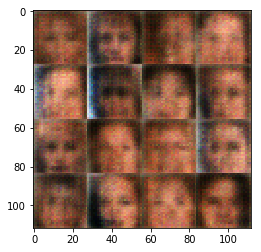

Epoch 1/2... Discriminator Loss: 1.1995... Generator Loss: 0.7711


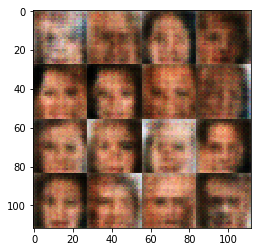

Epoch 1/2... Discriminator Loss: 1.5109... Generator Loss: 0.2849


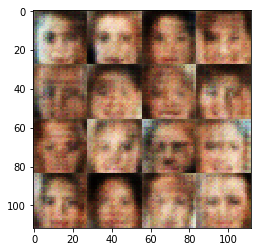

Epoch 1/2... Discriminator Loss: 1.0698... Generator Loss: 0.6723


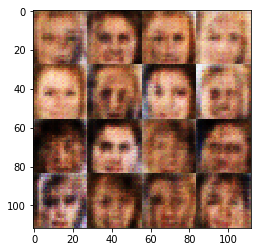

Epoch 1/2... Discriminator Loss: 1.4322... Generator Loss: 0.6769


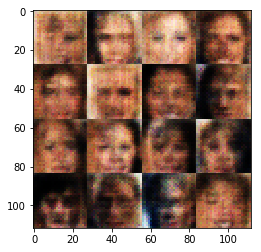

Epoch 1/2... Discriminator Loss: 1.3856... Generator Loss: 0.6873


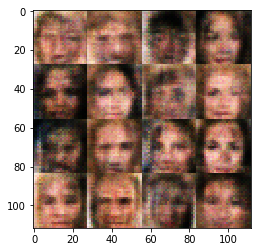

Epoch 1/2... Discriminator Loss: 1.1875... Generator Loss: 0.8398


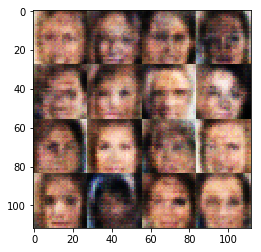

Epoch 1/2... Discriminator Loss: 1.3211... Generator Loss: 1.3303


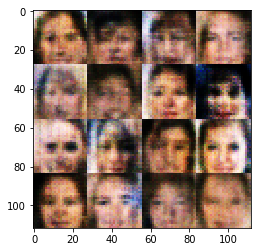

Epoch 1/2... Discriminator Loss: 1.1741... Generator Loss: 0.5504


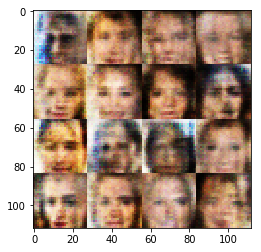

Epoch 1/2... Discriminator Loss: 0.9277... Generator Loss: 1.2243


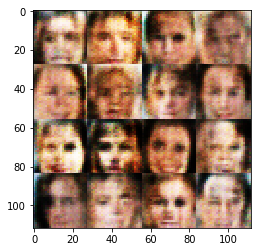

Epoch 1/2... Discriminator Loss: 1.2996... Generator Loss: 0.6161


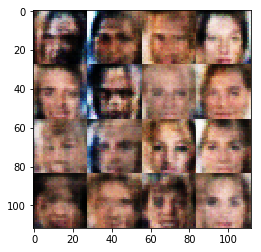

Epoch 1/2... Discriminator Loss: 1.7029... Generator Loss: 0.2627


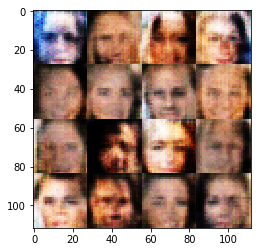

Epoch 1/2... Discriminator Loss: 1.2504... Generator Loss: 0.7803


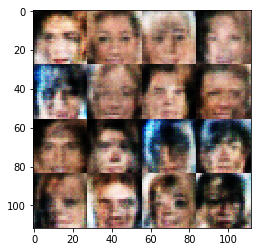

Epoch 1/2... Discriminator Loss: 2.0513... Generator Loss: 0.1787


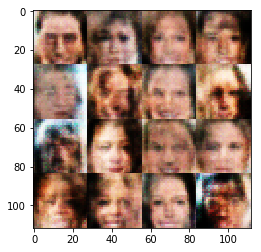

Epoch 1/2... Discriminator Loss: 1.1074... Generator Loss: 1.0826


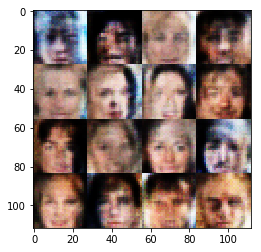

Epoch 1/2... Discriminator Loss: 1.2624... Generator Loss: 0.4948


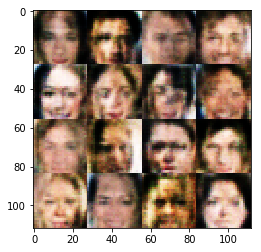

Epoch 1/2... Discriminator Loss: 1.3429... Generator Loss: 0.9120


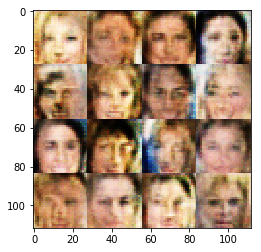

Epoch 1/2... Discriminator Loss: 1.3447... Generator Loss: 0.4742


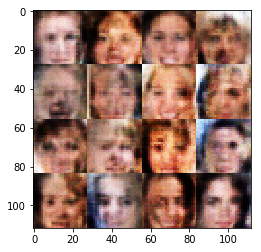

Epoch 1/2... Discriminator Loss: 1.5143... Generator Loss: 0.3174


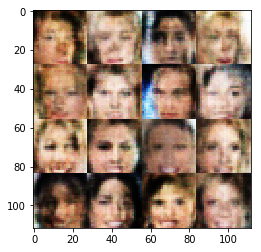

Epoch 1/2... Discriminator Loss: 1.1628... Generator Loss: 0.6793


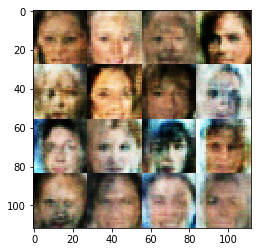

Epoch 1/2... Discriminator Loss: 0.9678... Generator Loss: 1.1498


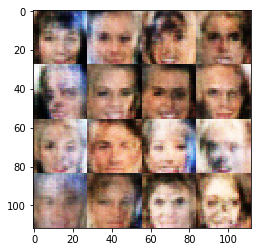

Epoch 1/2... Discriminator Loss: 1.4581... Generator Loss: 0.7211


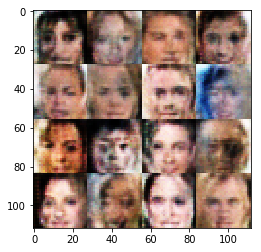

Epoch 1/2... Discriminator Loss: 1.0157... Generator Loss: 0.7543


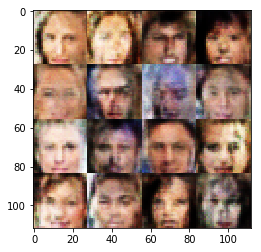

Epoch 1/2... Discriminator Loss: 1.1816... Generator Loss: 0.7564


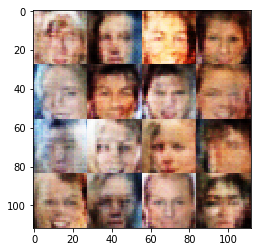

Epoch 1/2... Discriminator Loss: 1.1334... Generator Loss: 0.7614


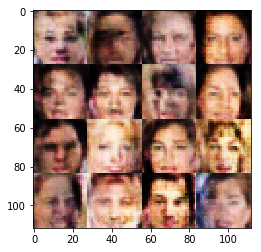

Epoch 1/2... Discriminator Loss: 1.0974... Generator Loss: 0.6183


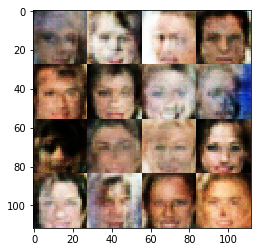

Epoch 1/2... Discriminator Loss: 1.0918... Generator Loss: 0.6370


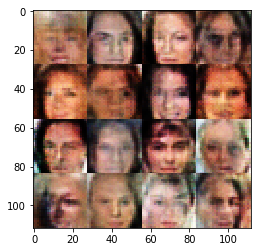

Epoch 1/2... Discriminator Loss: 0.9896... Generator Loss: 0.7932


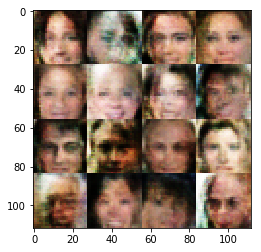

Epoch 1/2... Discriminator Loss: 1.0303... Generator Loss: 0.8724


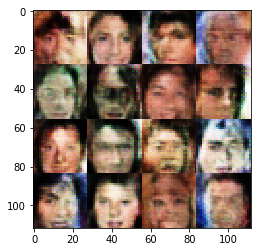

Epoch 1/2... Discriminator Loss: 1.2429... Generator Loss: 2.1832


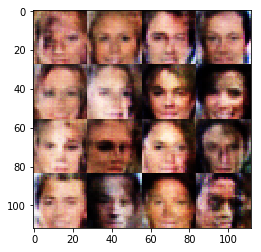

Epoch 1/2... Discriminator Loss: 1.0546... Generator Loss: 1.9058


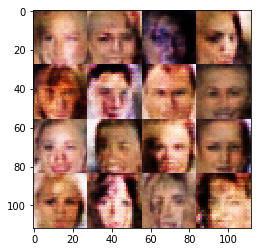

Epoch 1/2... Discriminator Loss: 1.3925... Generator Loss: 0.7844


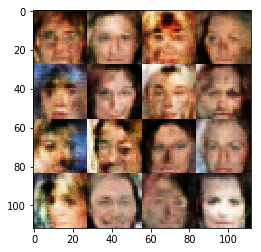

Epoch 1/2... Discriminator Loss: 1.0941... Generator Loss: 0.7039


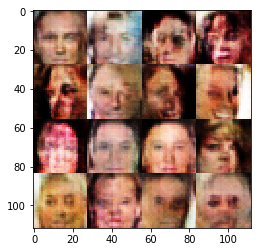

Epoch 1/2... Discriminator Loss: 1.2172... Generator Loss: 1.4624


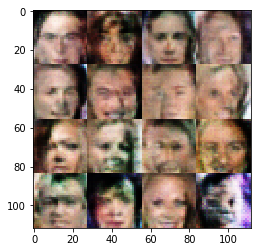

Epoch 1/2... Discriminator Loss: 0.9672... Generator Loss: 0.6991


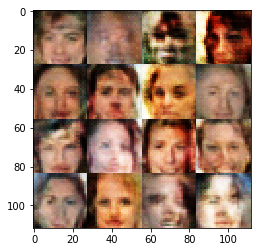

Epoch 1/2... Discriminator Loss: 0.7368... Generator Loss: 1.2471


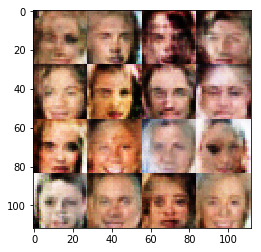

Epoch 1/2... Discriminator Loss: 0.9225... Generator Loss: 0.9103


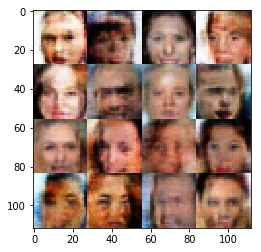

Epoch 1/2... Discriminator Loss: 0.8229... Generator Loss: 0.8562


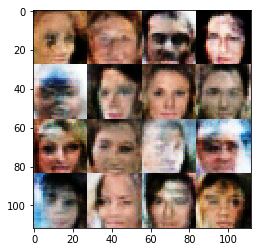

Epoch 1/2... Discriminator Loss: 1.1079... Generator Loss: 0.4974


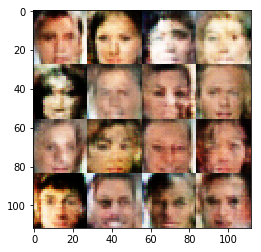

Epoch 1/2... Discriminator Loss: 1.1667... Generator Loss: 0.6448


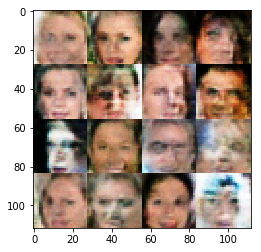

Epoch 1/2... Discriminator Loss: 0.9572... Generator Loss: 0.9891


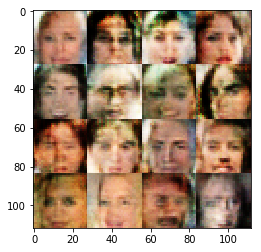

Epoch 1/2... Discriminator Loss: 0.6664... Generator Loss: 1.3541


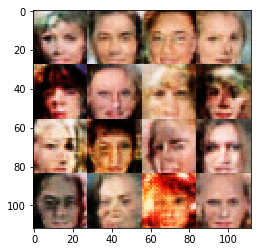

Epoch 1/2... Discriminator Loss: 0.9322... Generator Loss: 0.6718


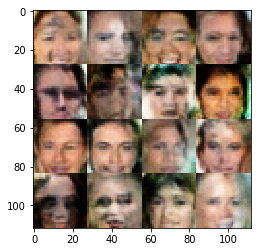

Epoch 1/2... Discriminator Loss: 1.9223... Generator Loss: 0.2340


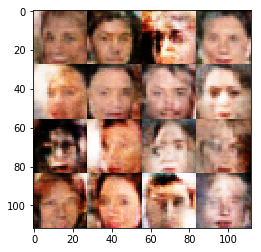

Epoch 1/2... Discriminator Loss: 1.4605... Generator Loss: 0.3563


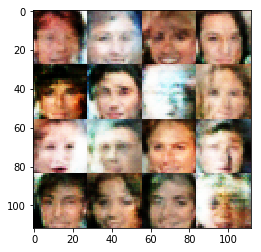

Epoch 1/2... Discriminator Loss: 1.8937... Generator Loss: 0.2230


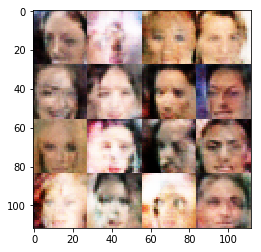

Epoch 1/2... Discriminator Loss: 1.1379... Generator Loss: 0.4760


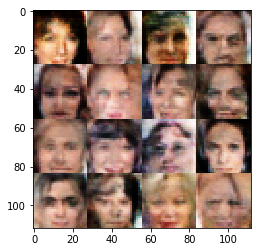

Epoch 1/2... Discriminator Loss: 1.3011... Generator Loss: 0.5463


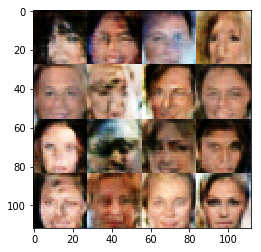

Epoch 1/2... Discriminator Loss: 0.9764... Generator Loss: 0.9243


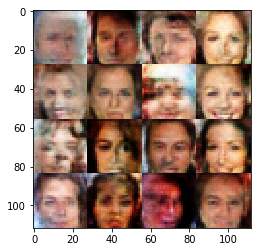

Epoch 1/2... Discriminator Loss: 1.2190... Generator Loss: 0.6286


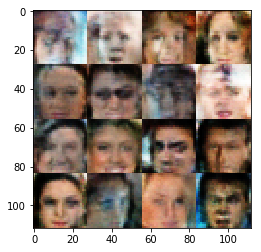

Epoch 1/2... Discriminator Loss: 1.2173... Generator Loss: 0.4904


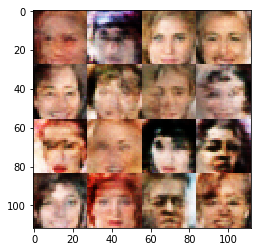

Epoch 1/2... Discriminator Loss: 0.7584... Generator Loss: 1.0124


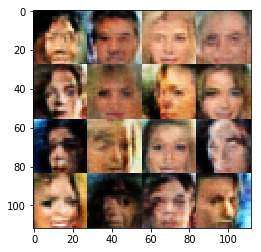

Epoch 1/2... Discriminator Loss: 1.2880... Generator Loss: 0.4413


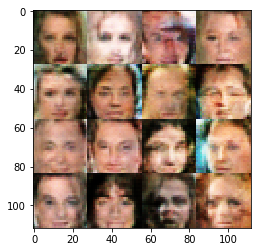

Epoch 1/2... Discriminator Loss: 0.9149... Generator Loss: 1.5086


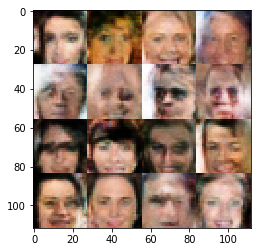

Epoch 1/2... Discriminator Loss: 1.0152... Generator Loss: 0.8760


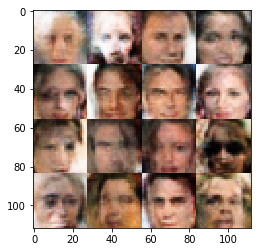

Epoch 1/2... Discriminator Loss: 1.0831... Generator Loss: 0.9718


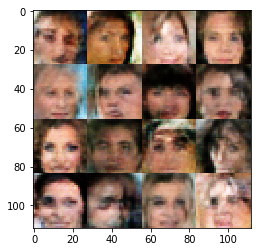

Epoch 1/2... Discriminator Loss: 1.5290... Generator Loss: 0.3165


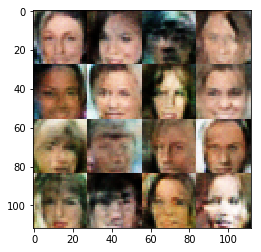

Epoch 1/2... Discriminator Loss: 1.4099... Generator Loss: 0.4149


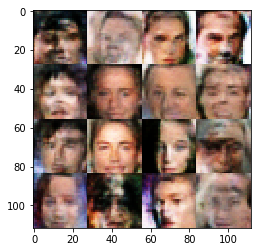

Epoch 1/2... Discriminator Loss: 1.9492... Generator Loss: 0.2009


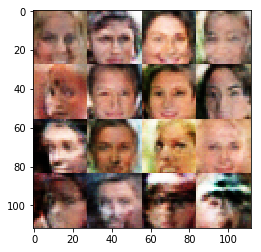

Epoch 1/2... Discriminator Loss: 1.2774... Generator Loss: 0.6488


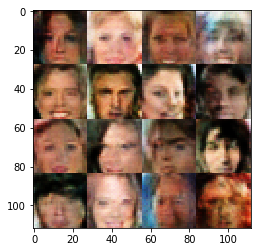

Epoch 1/2... Discriminator Loss: 1.3962... Generator Loss: 0.4006


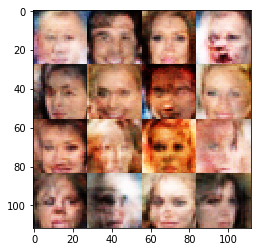

Epoch 1/2... Discriminator Loss: 1.4048... Generator Loss: 0.4506


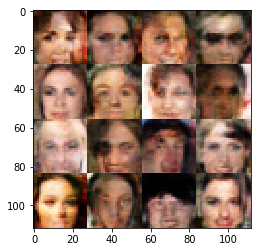

Epoch 1/2... Discriminator Loss: 1.1748... Generator Loss: 1.0095


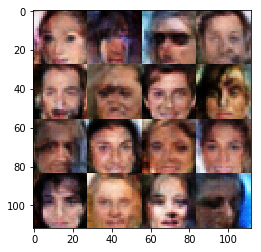

Epoch 1/2... Discriminator Loss: 1.4848... Generator Loss: 0.3242


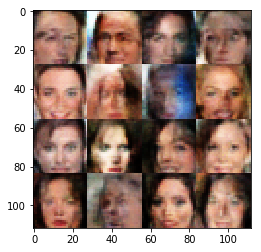

Epoch 1/2... Discriminator Loss: 1.0204... Generator Loss: 0.6817


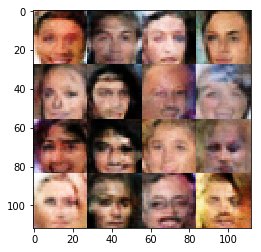

Epoch 1/2... Discriminator Loss: 1.4676... Generator Loss: 1.5511


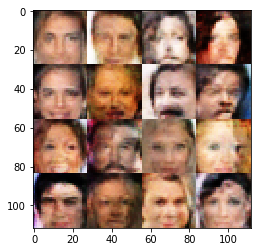

Epoch 1/2... Discriminator Loss: 1.2408... Generator Loss: 0.6717


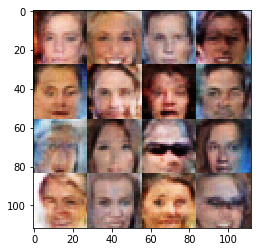

Epoch 1/2... Discriminator Loss: 1.0551... Generator Loss: 0.7945


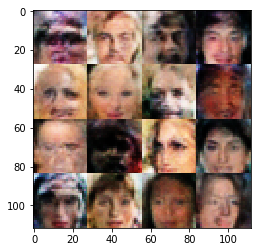

Epoch 1/2... Discriminator Loss: 1.6429... Generator Loss: 0.2814


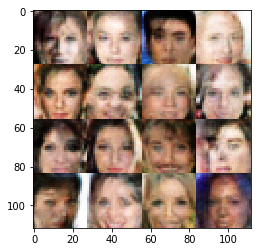

Epoch 1/2... Discriminator Loss: 1.6100... Generator Loss: 0.2939


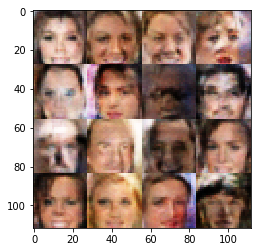

Epoch 1/2... Discriminator Loss: 1.1680... Generator Loss: 0.6360


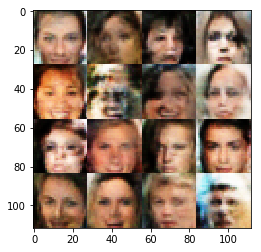

Epoch 1/2... Discriminator Loss: 0.8377... Generator Loss: 1.7318


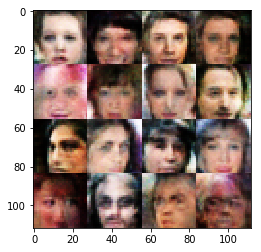

Epoch 1/2... Discriminator Loss: 1.1659... Generator Loss: 0.5099


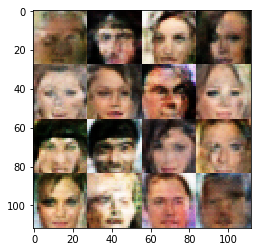

Epoch 1/2... Discriminator Loss: 1.2047... Generator Loss: 0.5320


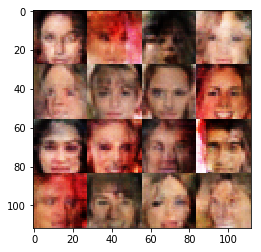

Epoch 1/2... Discriminator Loss: 0.7817... Generator Loss: 1.0566


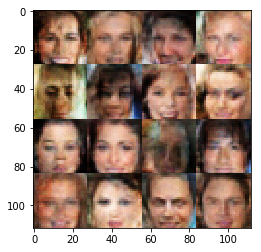

Epoch 1/2... Discriminator Loss: 1.3806... Generator Loss: 0.4891


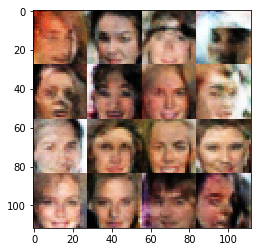

Epoch 1/2... Discriminator Loss: 1.2777... Generator Loss: 0.4667


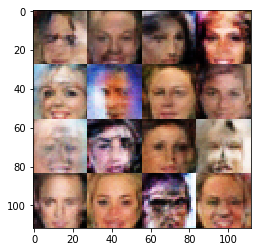

Epoch 1/2... Discriminator Loss: 0.9304... Generator Loss: 0.8357


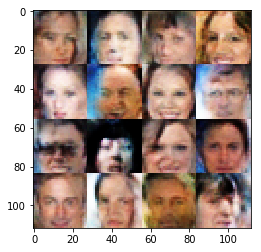

Epoch 1/2... Discriminator Loss: 1.5982... Generator Loss: 0.3238


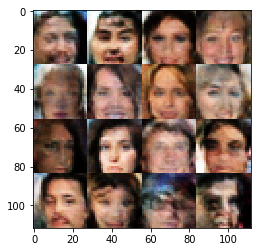

Epoch 1/2... Discriminator Loss: 1.2544... Generator Loss: 0.5088


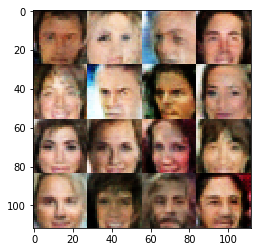

Epoch 1/2... Discriminator Loss: 1.1395... Generator Loss: 1.2249


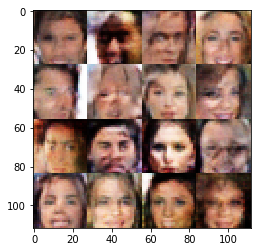

Epoch 1/2... Discriminator Loss: 1.3691... Generator Loss: 0.4090


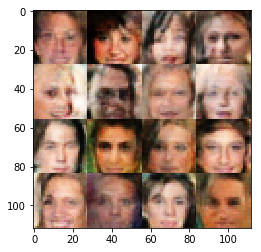

Epoch 1/2... Discriminator Loss: 1.3684... Generator Loss: 1.5520


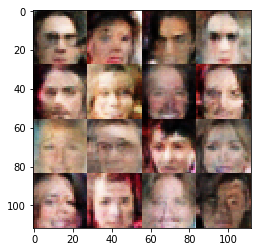

Epoch 1/2... Discriminator Loss: 1.3640... Generator Loss: 0.4352


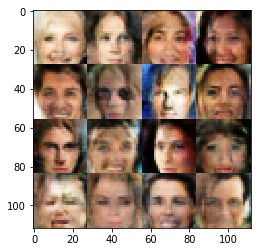

Epoch 1/2... Discriminator Loss: 1.1929... Generator Loss: 1.4366


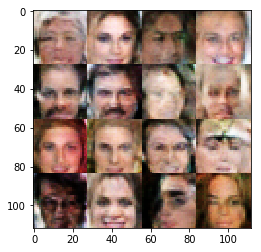

Epoch 1/2... Discriminator Loss: 1.2147... Generator Loss: 1.1098


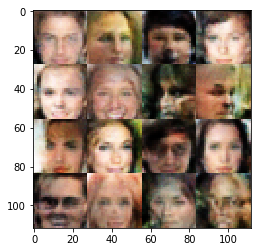

Epoch 1/2... Discriminator Loss: 1.5821... Generator Loss: 0.3018


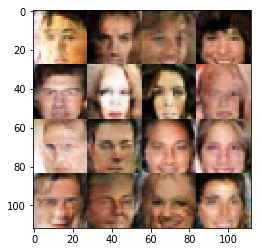

Epoch 1/2... Discriminator Loss: 0.9628... Generator Loss: 0.7864


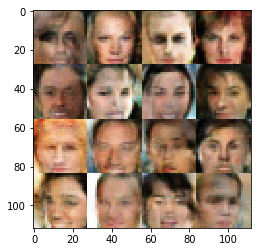

Epoch 1/2... Discriminator Loss: 1.0171... Generator Loss: 1.4160


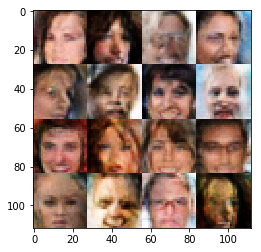

Epoch 1/2... Discriminator Loss: 1.1819... Generator Loss: 0.4609


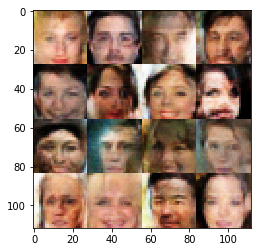

Epoch 1/2... Discriminator Loss: 1.4429... Generator Loss: 0.3955


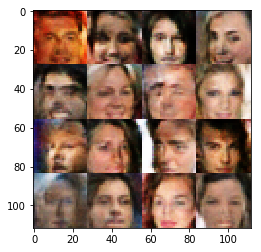

Epoch 1/2... Discriminator Loss: 0.7895... Generator Loss: 0.9719


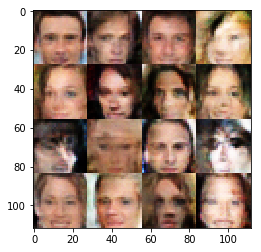

Epoch 1/2... Discriminator Loss: 1.7671... Generator Loss: 0.2468


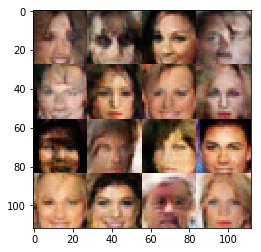

Epoch 1/2... Discriminator Loss: 1.3804... Generator Loss: 0.3704


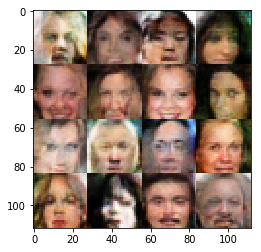

Epoch 1/2... Discriminator Loss: 1.8876... Generator Loss: 0.1985


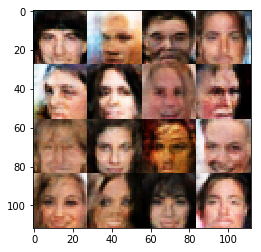

Epoch 1/2... Discriminator Loss: 0.9441... Generator Loss: 1.1979


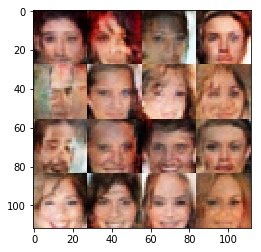

Epoch 1/2... Discriminator Loss: 1.6028... Generator Loss: 0.3009


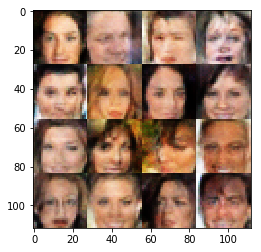

Epoch 1/2... Discriminator Loss: 1.0486... Generator Loss: 0.8880


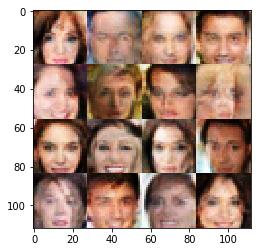

Epoch 1/2... Discriminator Loss: 1.9881... Generator Loss: 0.1893


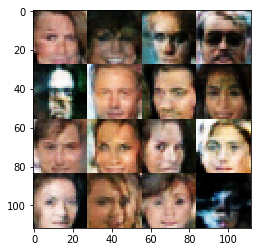

Epoch 1/2... Discriminator Loss: 0.6964... Generator Loss: 1.6940


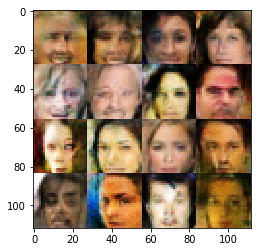

Epoch 1/2... Discriminator Loss: 1.4708... Generator Loss: 0.3559


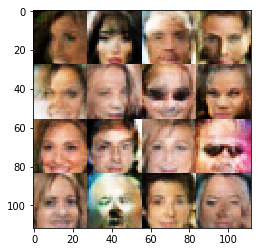

Epoch 1/2... Discriminator Loss: 0.9724... Generator Loss: 1.9684


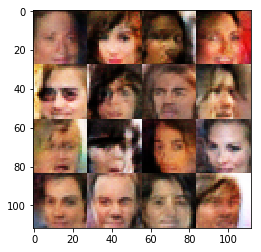

Epoch 2/2... Discriminator Loss: 1.0792... Generator Loss: 0.7332


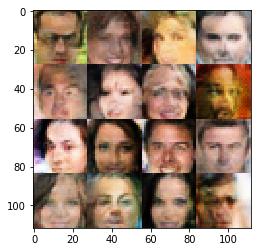

Epoch 2/2... Discriminator Loss: 1.5836... Generator Loss: 0.2983


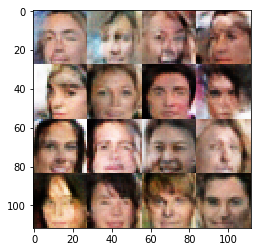

Epoch 2/2... Discriminator Loss: 1.1006... Generator Loss: 0.8171


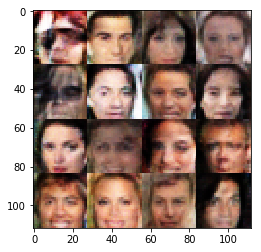

Epoch 2/2... Discriminator Loss: 1.2198... Generator Loss: 1.7708


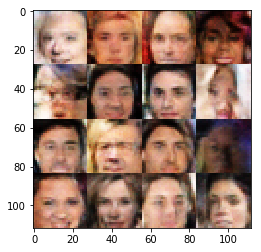

Epoch 2/2... Discriminator Loss: 1.7430... Generator Loss: 0.2455


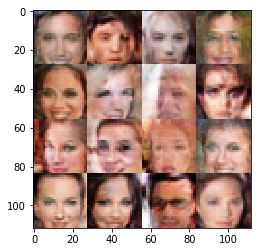

Epoch 2/2... Discriminator Loss: 0.9860... Generator Loss: 0.8016


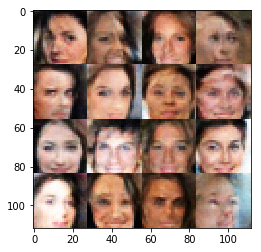

Epoch 2/2... Discriminator Loss: 0.8276... Generator Loss: 1.0607


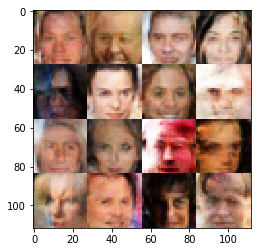

Epoch 2/2... Discriminator Loss: 0.9858... Generator Loss: 0.6508


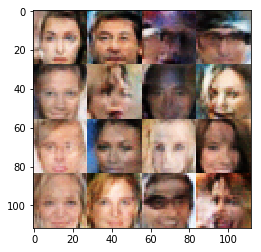

Epoch 2/2... Discriminator Loss: 0.7350... Generator Loss: 1.3383


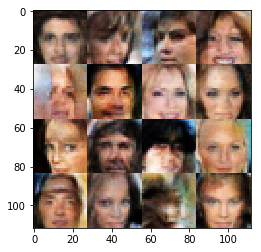

Epoch 2/2... Discriminator Loss: 0.9335... Generator Loss: 1.4182


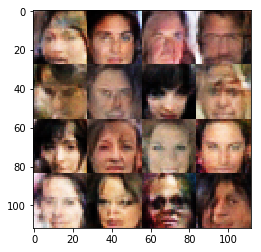

Epoch 2/2... Discriminator Loss: 1.2517... Generator Loss: 1.2121


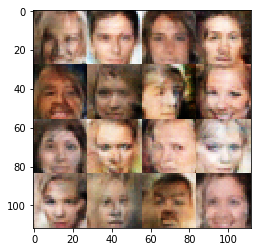

Epoch 2/2... Discriminator Loss: 1.0146... Generator Loss: 0.7259


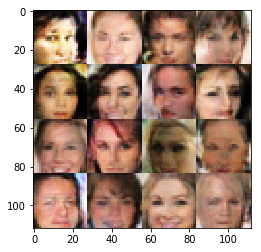

Epoch 2/2... Discriminator Loss: 1.1284... Generator Loss: 0.7613


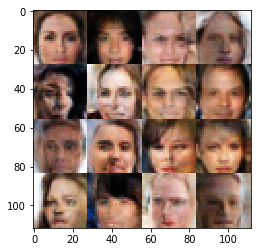

Epoch 2/2... Discriminator Loss: 1.4606... Generator Loss: 0.3299


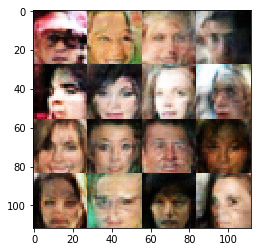

Epoch 2/2... Discriminator Loss: 1.5359... Generator Loss: 0.3069


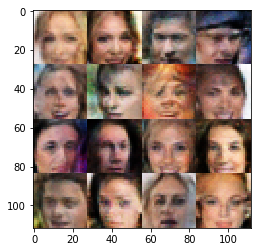

Epoch 2/2... Discriminator Loss: 1.3331... Generator Loss: 0.4188


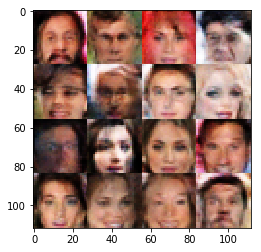

Epoch 2/2... Discriminator Loss: 1.2162... Generator Loss: 0.8013


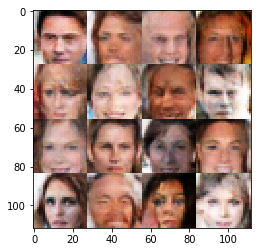

Epoch 2/2... Discriminator Loss: 1.4150... Generator Loss: 0.3521


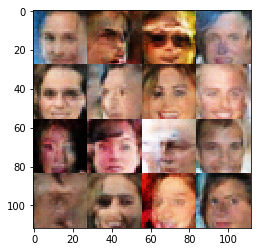

Epoch 2/2... Discriminator Loss: 1.2609... Generator Loss: 0.6956


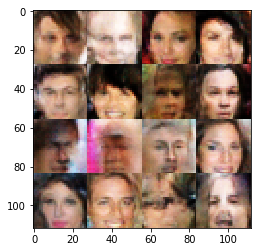

Epoch 2/2... Discriminator Loss: 1.0380... Generator Loss: 1.0191


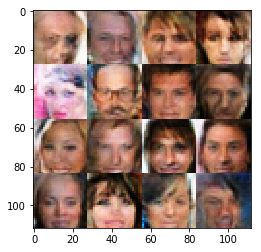

Epoch 2/2... Discriminator Loss: 1.5544... Generator Loss: 0.3071


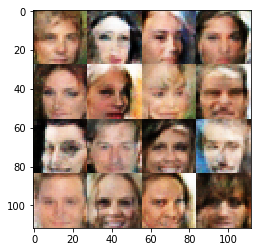

Epoch 2/2... Discriminator Loss: 1.0120... Generator Loss: 0.7500


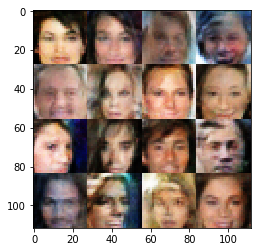

Epoch 2/2... Discriminator Loss: 1.2845... Generator Loss: 0.4394


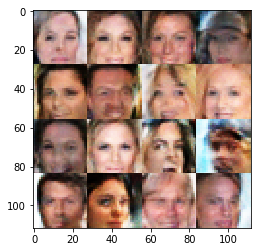

Epoch 2/2... Discriminator Loss: 1.3251... Generator Loss: 0.4153


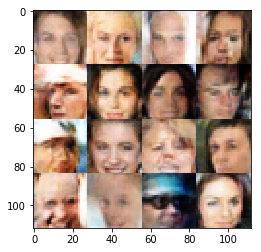

Epoch 2/2... Discriminator Loss: 1.4907... Generator Loss: 0.3282


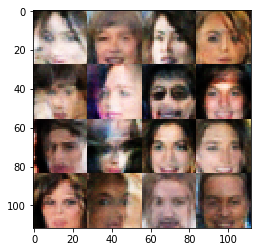

Epoch 2/2... Discriminator Loss: 0.9070... Generator Loss: 0.8303


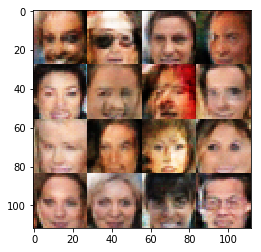

Epoch 2/2... Discriminator Loss: 1.0119... Generator Loss: 0.6018


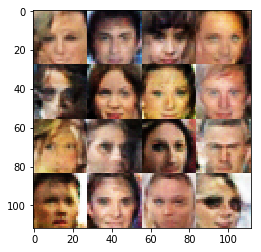

Epoch 2/2... Discriminator Loss: 2.1109... Generator Loss: 0.1536


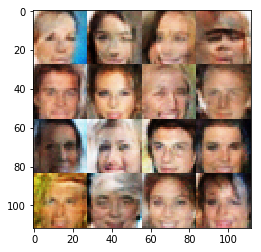

Epoch 2/2... Discriminator Loss: 2.1209... Generator Loss: 0.1912


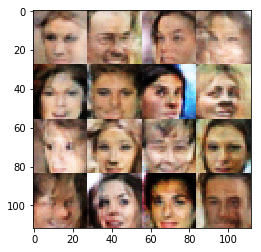

Epoch 2/2... Discriminator Loss: 1.6254... Generator Loss: 0.3189


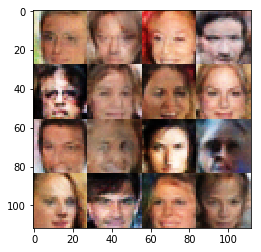

Epoch 2/2... Discriminator Loss: 0.9469... Generator Loss: 0.6268


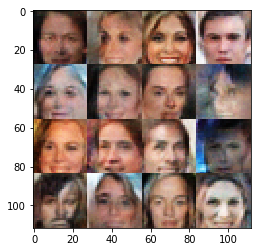

Epoch 2/2... Discriminator Loss: 0.6177... Generator Loss: 1.2160


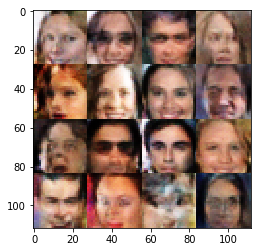

Epoch 2/2... Discriminator Loss: 1.9016... Generator Loss: 0.2114


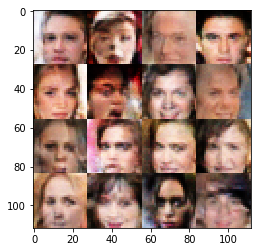

Epoch 2/2... Discriminator Loss: 0.9927... Generator Loss: 0.7706


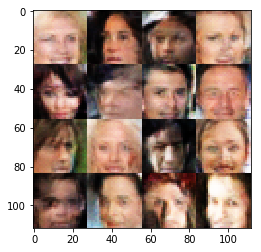

Epoch 2/2... Discriminator Loss: 1.3184... Generator Loss: 0.4065


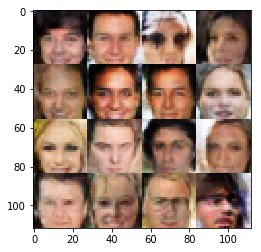

Epoch 2/2... Discriminator Loss: 0.5337... Generator Loss: 1.2188


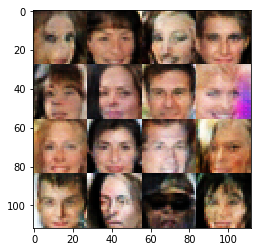

Epoch 2/2... Discriminator Loss: 0.8963... Generator Loss: 1.1668


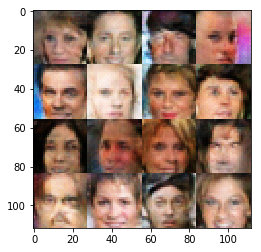

Epoch 2/2... Discriminator Loss: 1.4470... Generator Loss: 0.3760


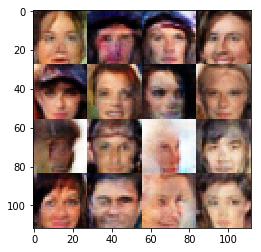

Epoch 2/2... Discriminator Loss: 1.7776... Generator Loss: 0.2362


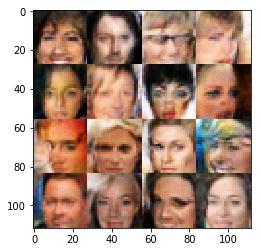

Epoch 2/2... Discriminator Loss: 1.6630... Generator Loss: 0.2575


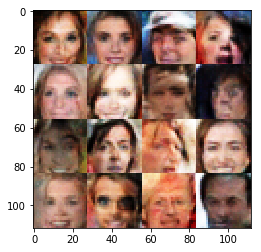

Epoch 2/2... Discriminator Loss: 1.0997... Generator Loss: 0.5835


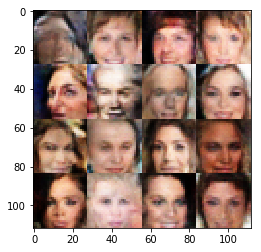

Epoch 2/2... Discriminator Loss: 1.5706... Generator Loss: 0.3000


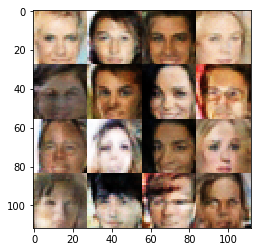

Epoch 2/2... Discriminator Loss: 1.4976... Generator Loss: 0.3402


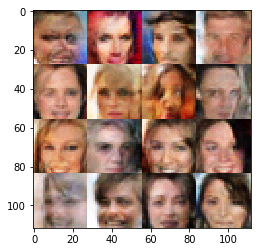

Epoch 2/2... Discriminator Loss: 1.4103... Generator Loss: 4.0223


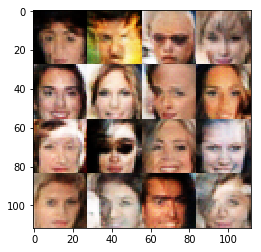

Epoch 2/2... Discriminator Loss: 1.0576... Generator Loss: 0.7577


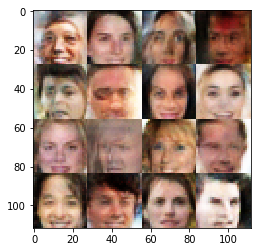

Epoch 2/2... Discriminator Loss: 1.4373... Generator Loss: 0.3768


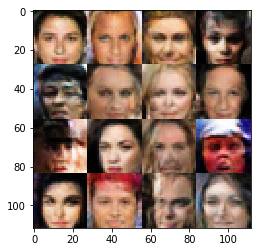

Epoch 2/2... Discriminator Loss: 0.9749... Generator Loss: 1.4367


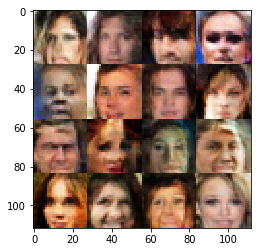

Epoch 2/2... Discriminator Loss: 1.2513... Generator Loss: 0.4771


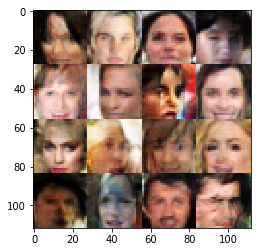

Epoch 2/2... Discriminator Loss: 1.0035... Generator Loss: 1.1395


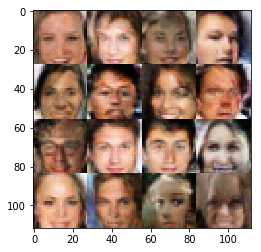

Epoch 2/2... Discriminator Loss: 0.8210... Generator Loss: 0.8638


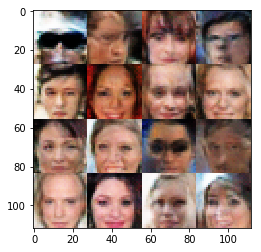

Epoch 2/2... Discriminator Loss: 0.6393... Generator Loss: 1.4906


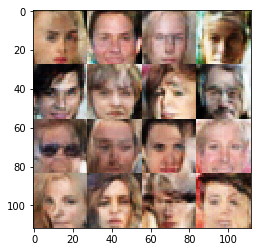

Epoch 2/2... Discriminator Loss: 1.2498... Generator Loss: 0.4864


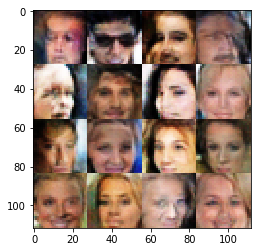

Epoch 2/2... Discriminator Loss: 0.9439... Generator Loss: 0.7875


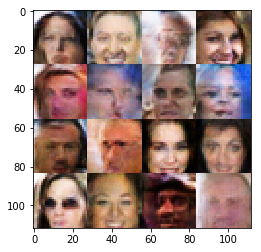

Epoch 2/2... Discriminator Loss: 0.8144... Generator Loss: 1.1320


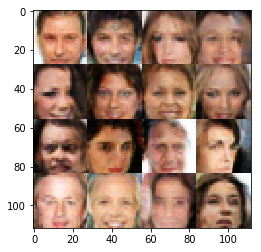

Epoch 2/2... Discriminator Loss: 0.6417... Generator Loss: 1.0592


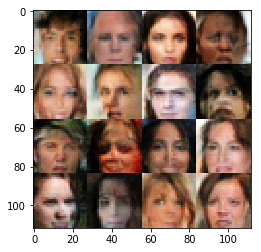

Epoch 2/2... Discriminator Loss: 1.0868... Generator Loss: 1.0167


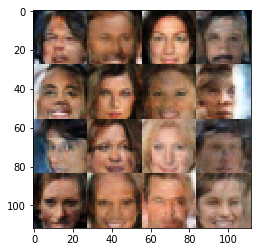

Epoch 2/2... Discriminator Loss: 1.5315... Generator Loss: 0.4905


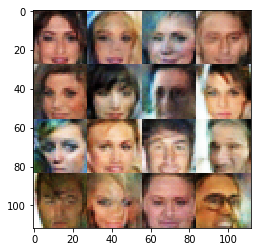

Epoch 2/2... Discriminator Loss: 1.2953... Generator Loss: 0.4239


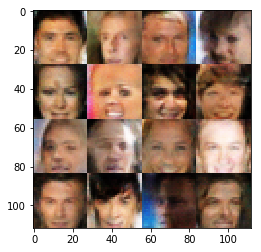

Epoch 2/2... Discriminator Loss: 1.2207... Generator Loss: 0.5846


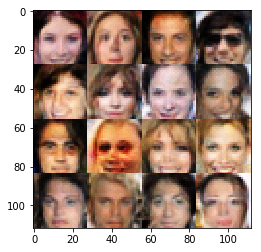

Epoch 2/2... Discriminator Loss: 0.6977... Generator Loss: 1.1133


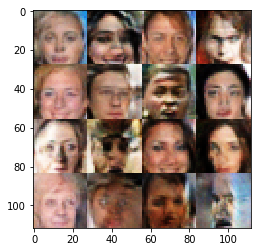

Epoch 2/2... Discriminator Loss: 0.8914... Generator Loss: 0.9375


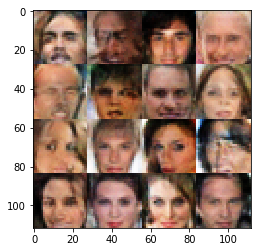

Epoch 2/2... Discriminator Loss: 0.8455... Generator Loss: 0.7724


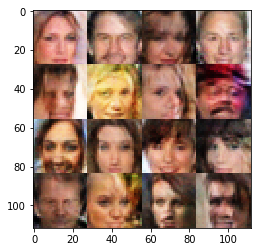

Epoch 2/2... Discriminator Loss: 1.0110... Generator Loss: 1.5854


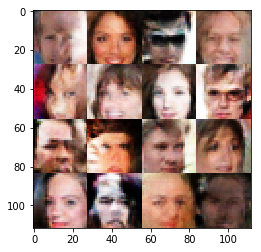

Epoch 2/2... Discriminator Loss: 1.0211... Generator Loss: 0.6088


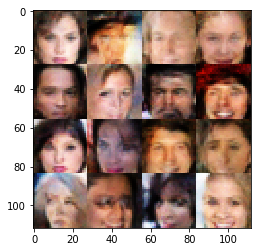

Epoch 2/2... Discriminator Loss: 0.7834... Generator Loss: 0.8801


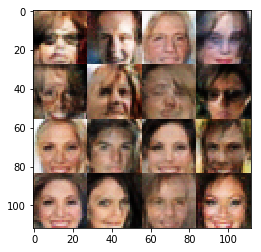

Epoch 2/2... Discriminator Loss: 0.9417... Generator Loss: 0.7516


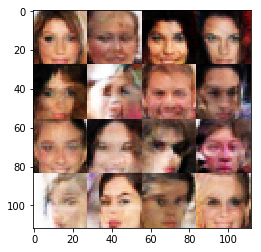

Epoch 2/2... Discriminator Loss: 1.2641... Generator Loss: 0.5129


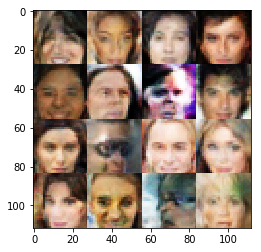

Epoch 2/2... Discriminator Loss: 1.1092... Generator Loss: 0.6249


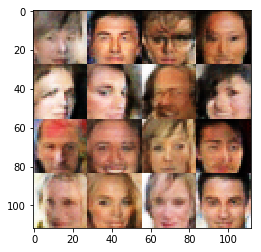

Epoch 2/2... Discriminator Loss: 0.9330... Generator Loss: 1.1320


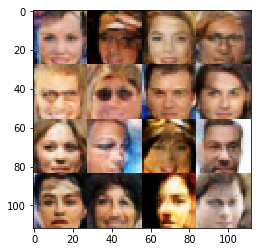

Epoch 2/2... Discriminator Loss: 1.5837... Generator Loss: 0.3752


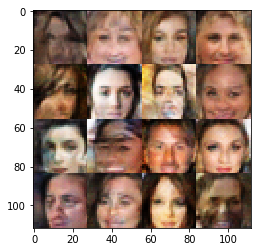

Epoch 2/2... Discriminator Loss: 1.3507... Generator Loss: 0.3768


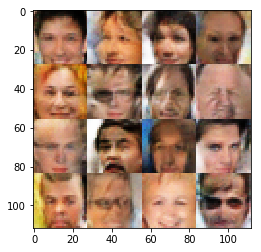

Epoch 2/2... Discriminator Loss: 0.9562... Generator Loss: 1.3936


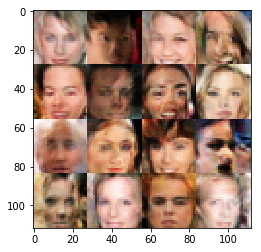

Epoch 2/2... Discriminator Loss: 1.1994... Generator Loss: 0.4721


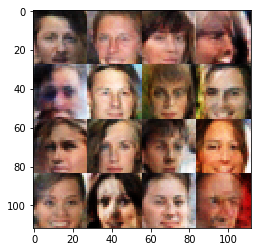

Epoch 2/2... Discriminator Loss: 1.0516... Generator Loss: 0.7582


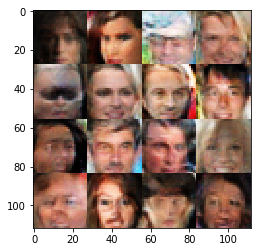

Epoch 2/2... Discriminator Loss: 0.6485... Generator Loss: 2.5761


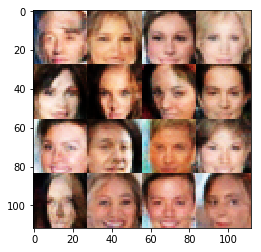

Epoch 2/2... Discriminator Loss: 1.0212... Generator Loss: 0.6746


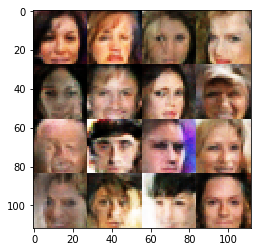

Epoch 2/2... Discriminator Loss: 0.9284... Generator Loss: 0.7826


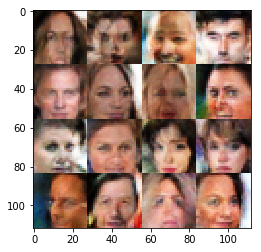

Epoch 2/2... Discriminator Loss: 0.9894... Generator Loss: 0.7731


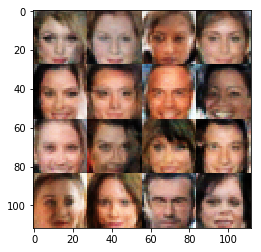

Epoch 2/2... Discriminator Loss: 0.9286... Generator Loss: 0.8550


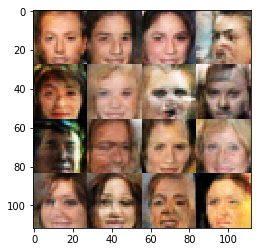

Epoch 2/2... Discriminator Loss: 1.0527... Generator Loss: 1.9020


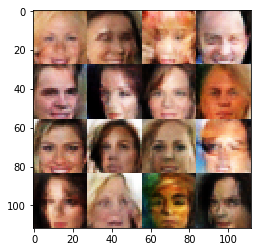

Epoch 2/2... Discriminator Loss: 1.0746... Generator Loss: 0.6915


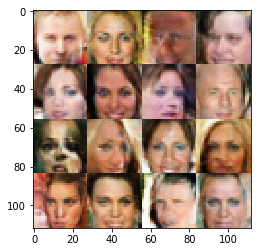

Epoch 2/2... Discriminator Loss: 0.9972... Generator Loss: 0.8482


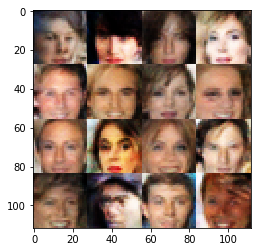

Epoch 2/2... Discriminator Loss: 1.0202... Generator Loss: 0.7743


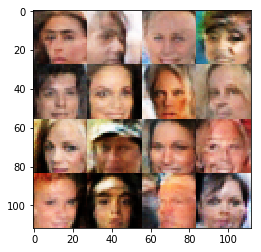

Epoch 2/2... Discriminator Loss: 1.5925... Generator Loss: 0.3483


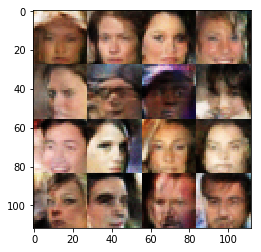

Epoch 2/2... Discriminator Loss: 0.7261... Generator Loss: 1.4751


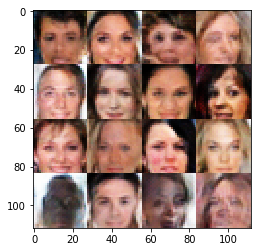

Epoch 2/2... Discriminator Loss: 1.0782... Generator Loss: 0.6615


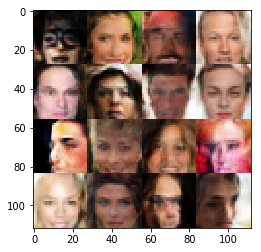

Epoch 2/2... Discriminator Loss: 0.8905... Generator Loss: 0.8945


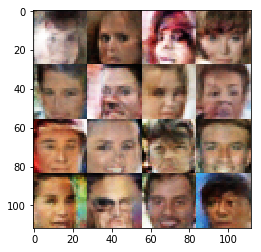

Epoch 2/2... Discriminator Loss: 0.6958... Generator Loss: 1.0040


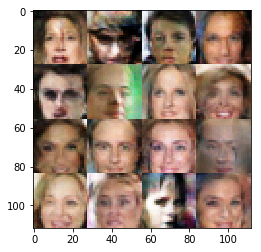

Epoch 2/2... Discriminator Loss: 1.2929... Generator Loss: 0.4724


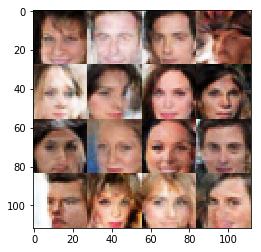

Epoch 2/2... Discriminator Loss: 0.9929... Generator Loss: 0.9726


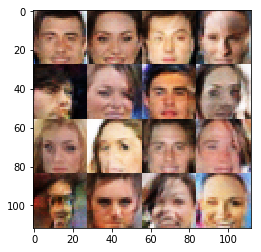

Epoch 2/2... Discriminator Loss: 0.9518... Generator Loss: 0.8661


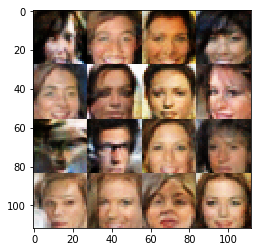

Epoch 2/2... Discriminator Loss: 0.7888... Generator Loss: 1.7214


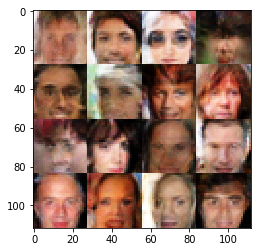

Epoch 2/2... Discriminator Loss: 0.9197... Generator Loss: 1.5424


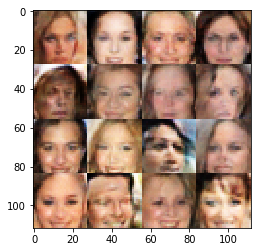

Epoch 2/2... Discriminator Loss: 1.2255... Generator Loss: 0.4432


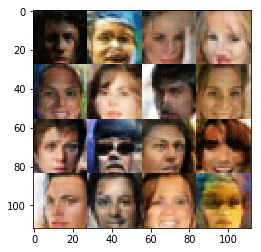

Epoch 2/2... Discriminator Loss: 0.5878... Generator Loss: 1.1232


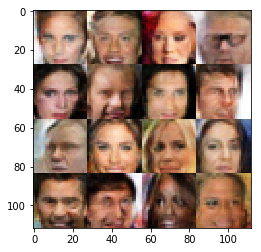

Epoch 2/2... Discriminator Loss: 0.6331... Generator Loss: 1.1437


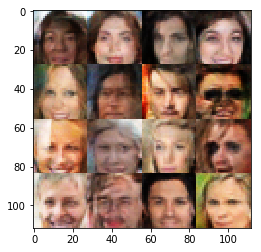

Epoch 2/2... Discriminator Loss: 0.2963... Generator Loss: 2.0994


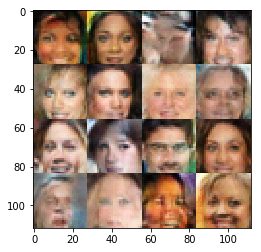

Epoch 2/2... Discriminator Loss: 1.2243... Generator Loss: 0.4800


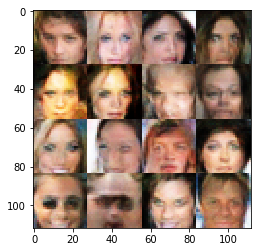

Epoch 2/2... Discriminator Loss: 1.4762... Generator Loss: 0.3222


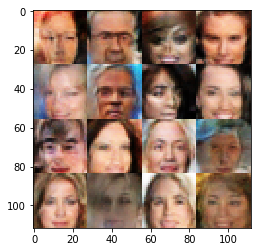

Epoch 2/2... Discriminator Loss: 1.7162... Generator Loss: 0.2500


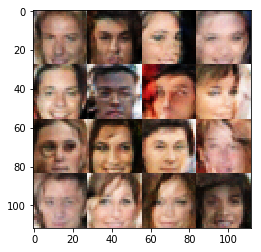

Epoch 2/2... Discriminator Loss: 0.2942... Generator Loss: 2.0379


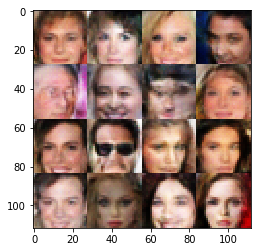

Epoch 2/2... Discriminator Loss: 1.0449... Generator Loss: 0.7304


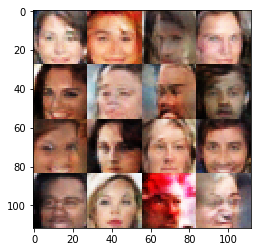

Epoch 2/2... Discriminator Loss: 1.0272... Generator Loss: 1.4574


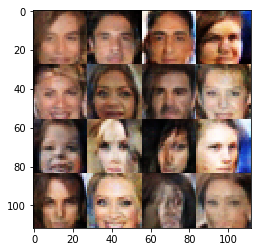

Epoch 2/2... Discriminator Loss: 0.8730... Generator Loss: 0.7946


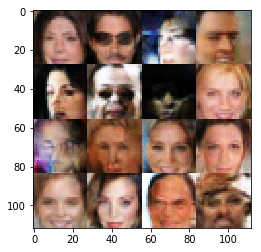

Epoch 2/2... Discriminator Loss: 1.8306... Generator Loss: 0.3607


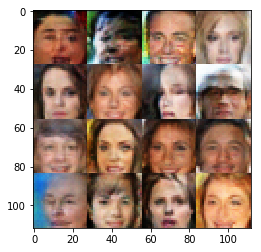

Epoch 2/2... Discriminator Loss: 0.8161... Generator Loss: 1.2362


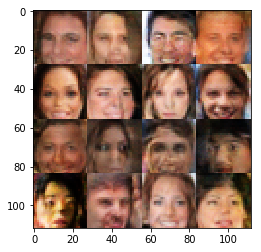

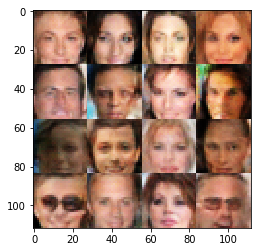

In [22]:
batch_size = 64
z_dim = 100
learning_rate = 0.001
beta1 = 0.3


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.